Functions for plotting image

In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [82]:
def show(img):
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(img, cmap='gray')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

In [83]:
#This function will plot two images side by side
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

# 6. Thresholding on image

Binary Thresholding

In [84]:
def binary_thresholding(image, threshold_value = 127, max_val = 255): 
    
    ret,thresh1 = cv2.threshold(image, threshold_value, max_val, cv2.THRESH_BINARY)
    return thresh1

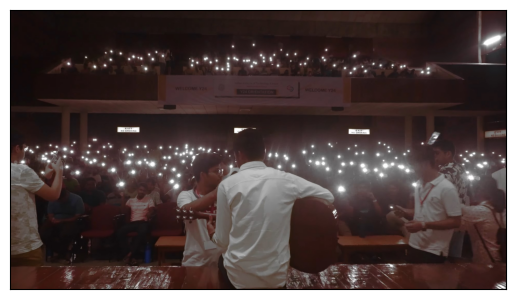

In [85]:

audi=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\Audi_IITK_SJ_Guitar.jpg")
show(audi)

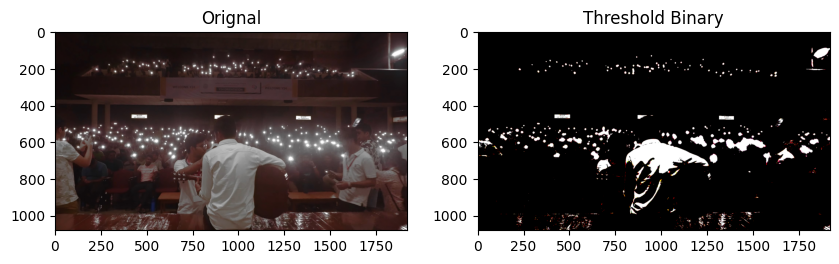

In [86]:
image_thresh=binary_thresholding(audi)

plot_image(audi, image_thresh, title_2="Threshold Binary")

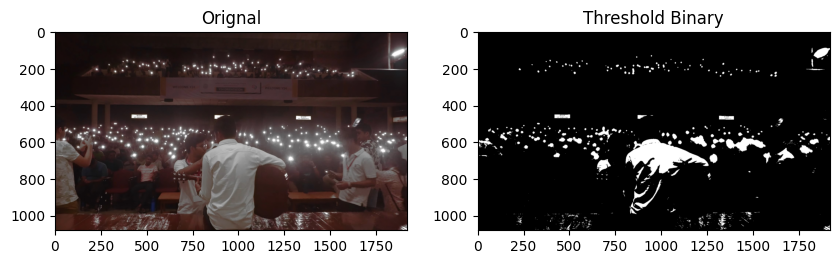

In [87]:
gray = cv2.cvtColor(audi, cv2.COLOR_BGR2GRAY)

image_thresh=binary_thresholding(gray)

plot_image(audi, image_thresh, title_2="Threshold Binary")

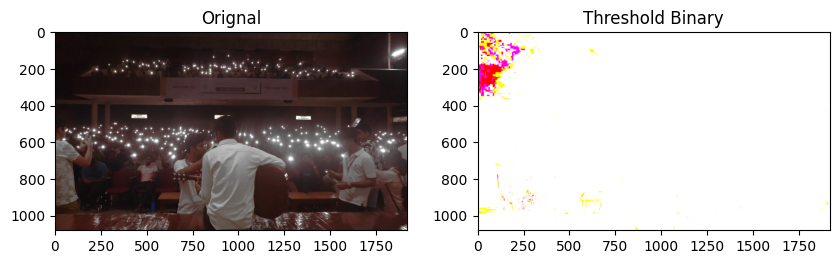

In [88]:
image_thresh=binary_thresholding(audi, 10, 255)

plot_image(audi, image_thresh, title_2="Threshold Binary")


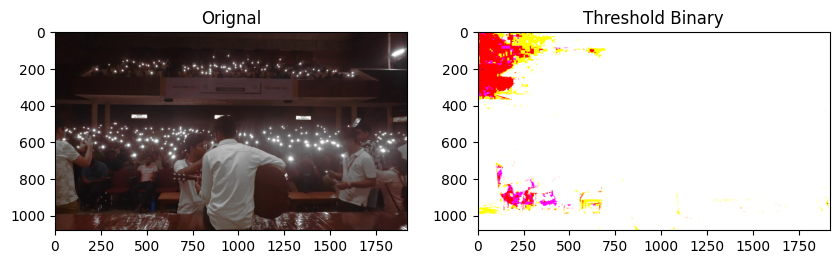

In [89]:
image_thresh=binary_thresholding(audi, 12, 255)

plot_image(audi, image_thresh, title_2="Threshold Binary")

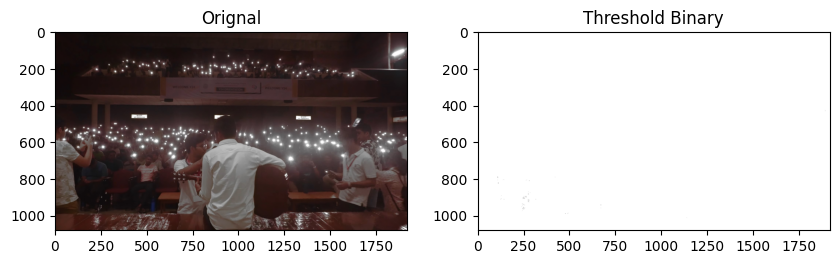

In [90]:
gray = cv2.cvtColor(audi, cv2.COLOR_BGR2GRAY)

image_thresh=binary_thresholding(gray, 10, 255)

plot_image(audi, image_thresh, title_2="Threshold Binary")

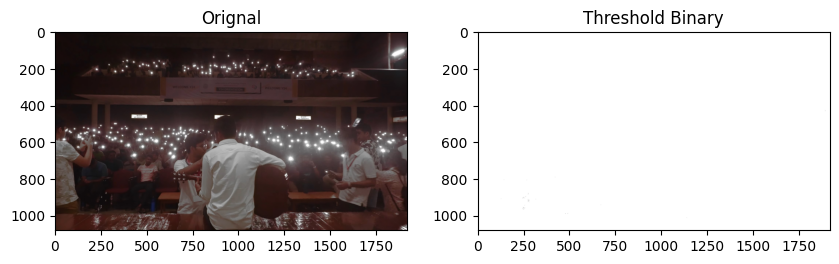

In [91]:
gray = cv2.cvtColor(audi, cv2.COLOR_BGR2GRAY)

image_thresh=binary_thresholding(gray, 8, 255)

plot_image(audi, image_thresh, title_2="Threshold Binary")

Adaptive Mean Thresholding

In [92]:
def adaptive_mean_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blok_size, C_dst)
    
    return th

# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

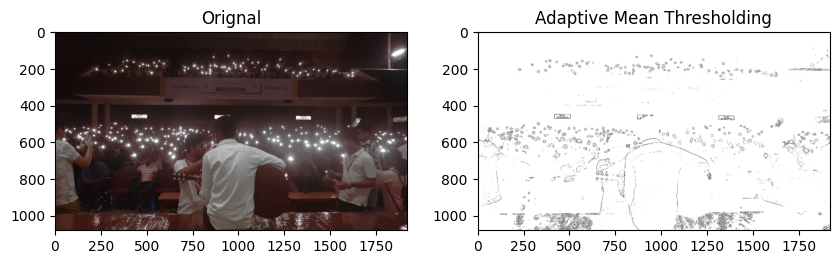

In [93]:
img_gray = get_grayscale(audi)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 3, 5)

plot_image(audi, image_mean_thresh, title_2='Adaptive Mean Thresholding')

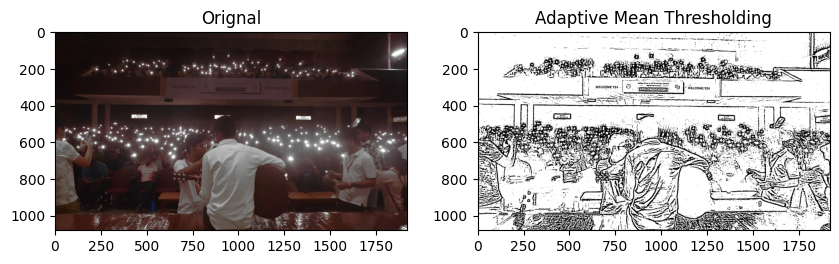

In [94]:
img_gray = get_grayscale(audi)

image_mean_thresh=adaptive_mean_thresholding(img_gray)

plot_image(audi, image_mean_thresh, title_2='Adaptive Mean Thresholding')

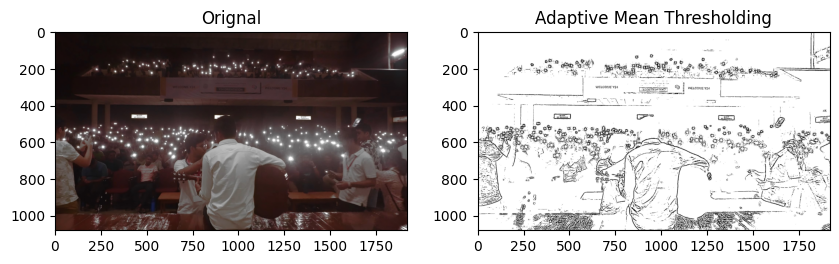

In [95]:
img_gray=get_grayscale(audi)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 7, 4)

plot_image(audi, image_mean_thresh, title_2='Adaptive Mean Thresholding')

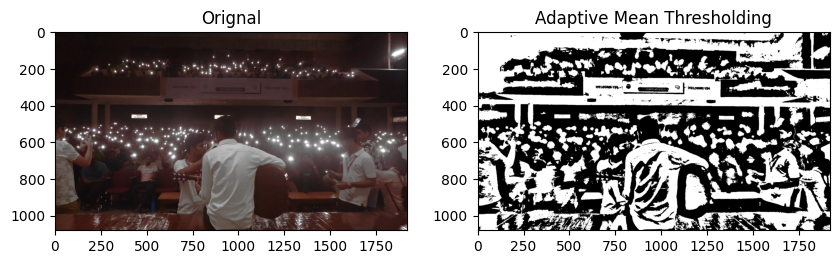

In [96]:
img_gray = get_grayscale(audi)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 99, 3)

plot_image(audi, image_mean_thresh, title_2='Adaptive Mean Thresholding')

Adaptive gaussian thresholding

In [97]:
def adaptive_gaussian_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blok_size, C_dst)
    return th

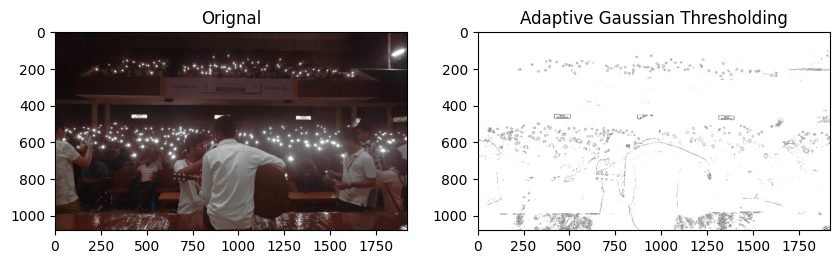

In [98]:
img_gray = get_grayscale(audi)

image_mean_thresh=adaptive_gaussian_thresholding(img_gray, 255, 3, 5)

plot_image(audi, image_mean_thresh, title_2='Adaptive Gaussian Thresholding')

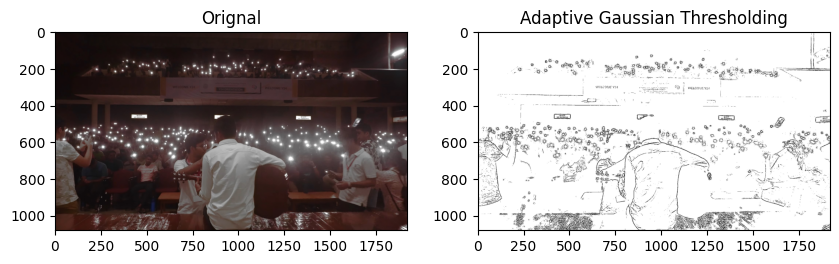

In [99]:
img_gray = get_grayscale(audi)

th2 = adaptive_gaussian_thresholding(img_gray, 255, 7, 4)

plot_image(audi, th2, title_2='Adaptive Gaussian Thresholding')

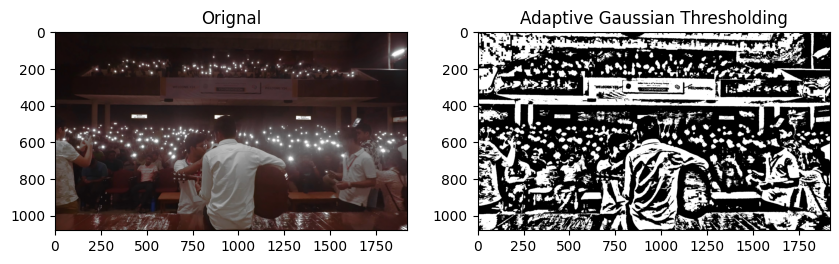

In [100]:
img_gray = get_grayscale(audi)

th2 = adaptive_gaussian_thresholding(img_gray, 255, 115, 1)

plot_image(audi, th2, title_2='Adaptive Gaussian Thresholding')

In [101]:
#thresholding
def otsu_thresholding(image, value=0, m=255):
    
    return cv2.threshold(image, value, m, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

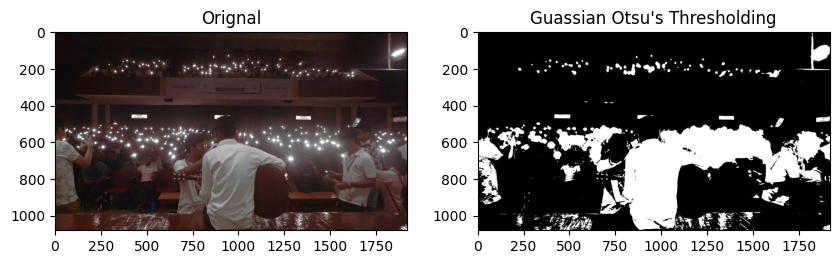

In [102]:
img_gray = get_grayscale(audi)

image_otsu_thresh=otsu_thresholding(img_gray, 125, 255)

plot_image(audi, image_otsu_thresh, title_2="Guassian Otsu's Thresholding")

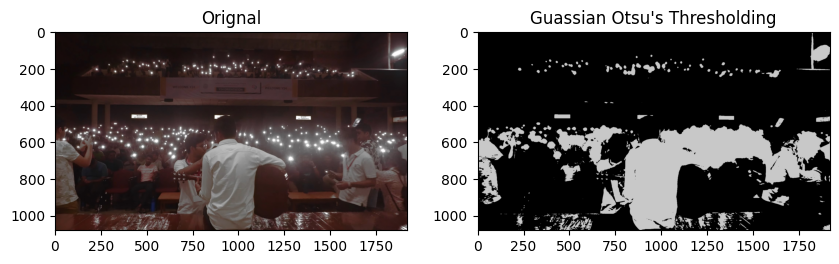

In [103]:
#Noice Reduction by Gaussian Filter

def gaussian_blur(img, kernel=(3, 3), sigmaX=0, sigmaY=0):
    return cv2.GaussianBlur(img, kernel, sigmaX, sigmaY)


# Otsu's thresholding after Gaussian filtering

blur = gaussian_blur(audi)
img_gray = get_grayscale(blur)
image_otsu_thresh=otsu_thresholding(img_gray, 0, 200)
plot_image(audi, image_otsu_thresh, title_2="Guassian Otsu's Thresholding")

# 7. Morphological Transformations

Erosion


In [104]:
def erode(image, kernel=(5, 5), iterations=1):
    
    return cv2.erode(image, np.ones(kernel,np.uint8), iterations)

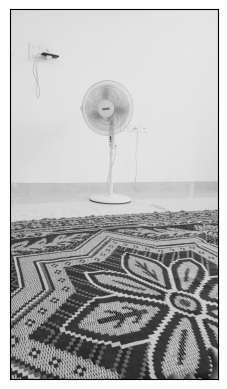

In [105]:
fan=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\Fan.jpg")
show(fan)

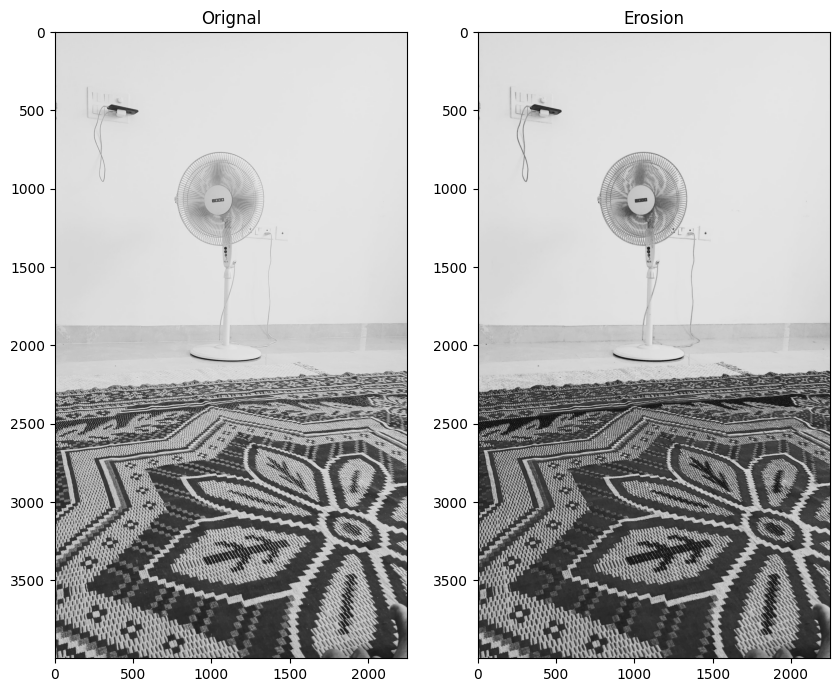

In [106]:
image_erosion=erode(fan, (3, 3), 1)
plot_image(fan, image_erosion, title_2="Erosion")

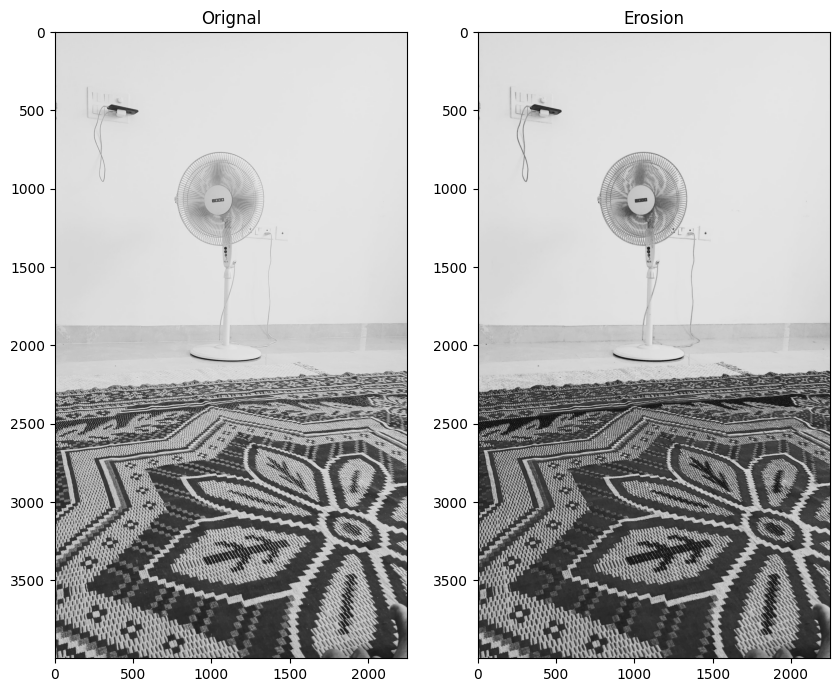

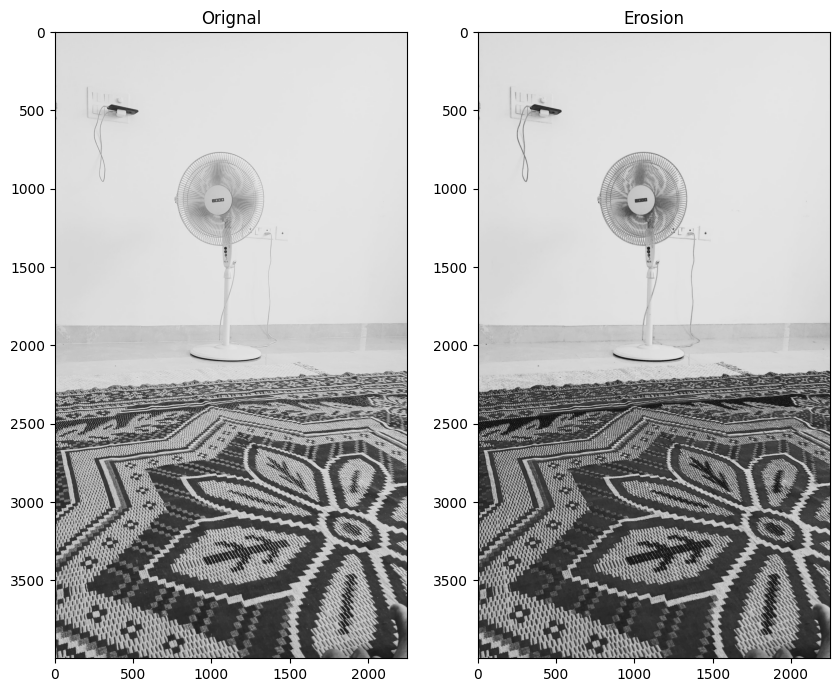

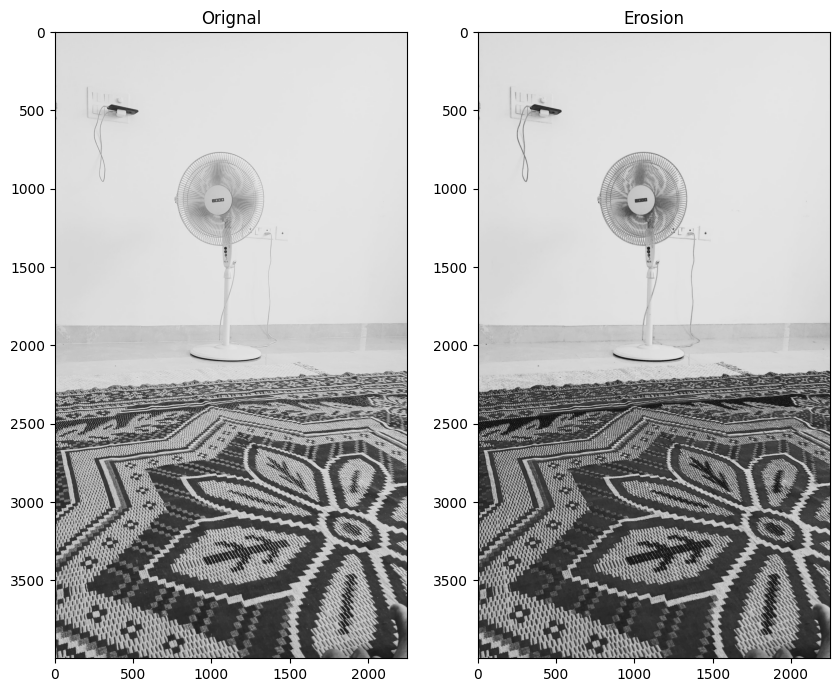

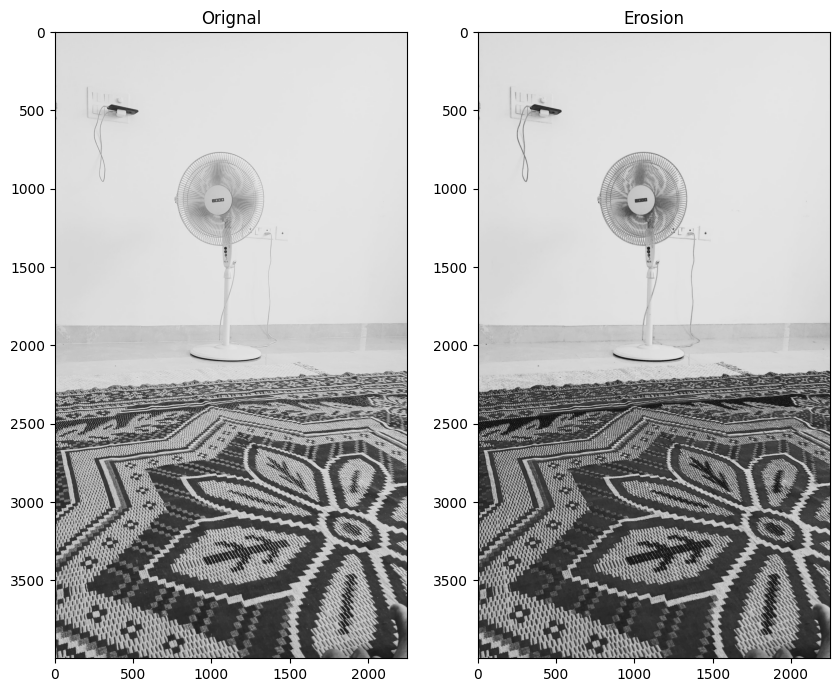

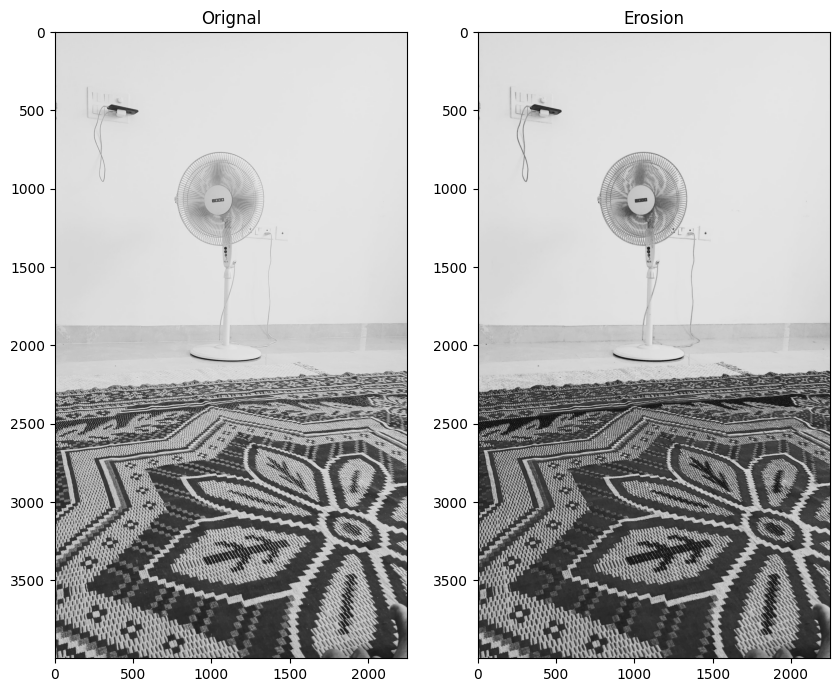

In [107]:
for i in range(1, 6):
    image = get_grayscale(fan)

    image_erosion=erode(image, (3, 3), i)

    plot_image(fan, image_erosion, title_2="Erosion")

Dilation

In [108]:
#dilation
def dilation(image, kernel=(5, 5), iterations=1):
    
    return cv2.dilate(image, np.ones(kernel, np.uint8), iterations)

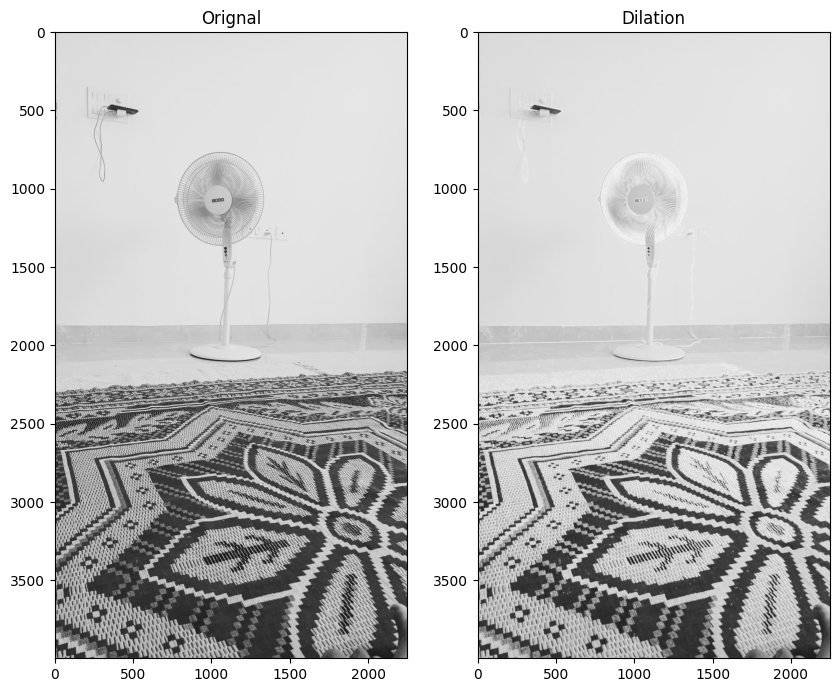

In [109]:
image_dilation=dilation(fan)

plot_image(fan, image_dilation, title_2="Dilation")

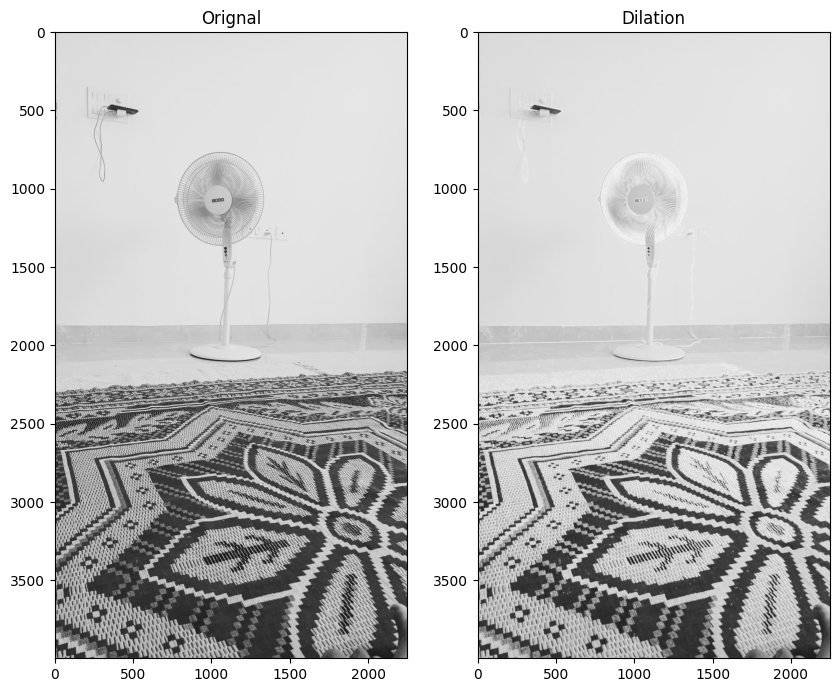

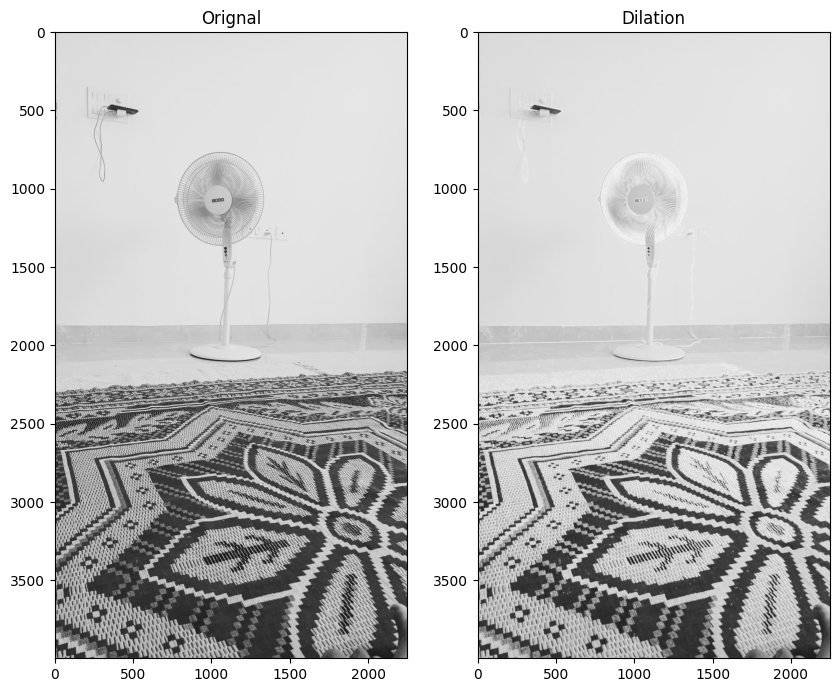

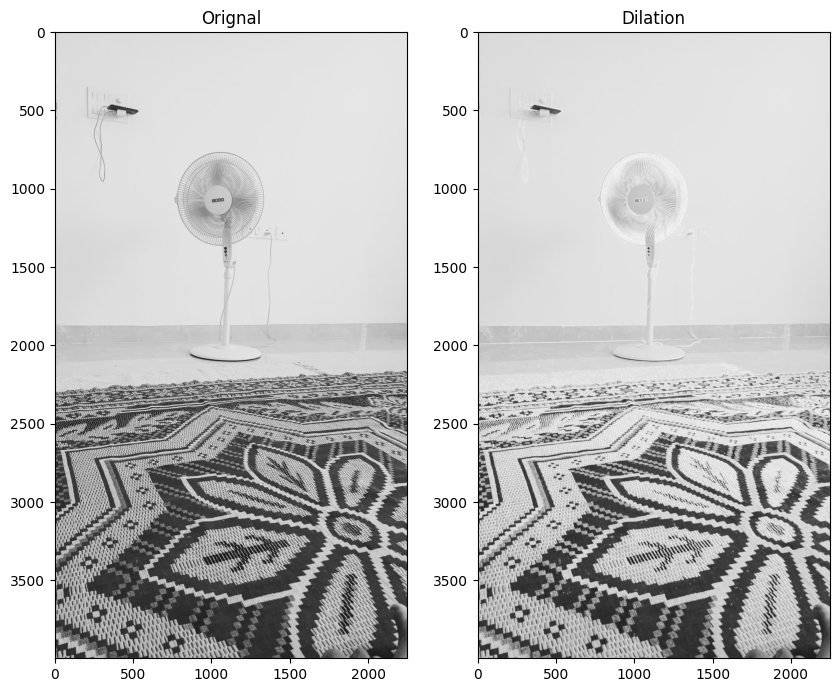

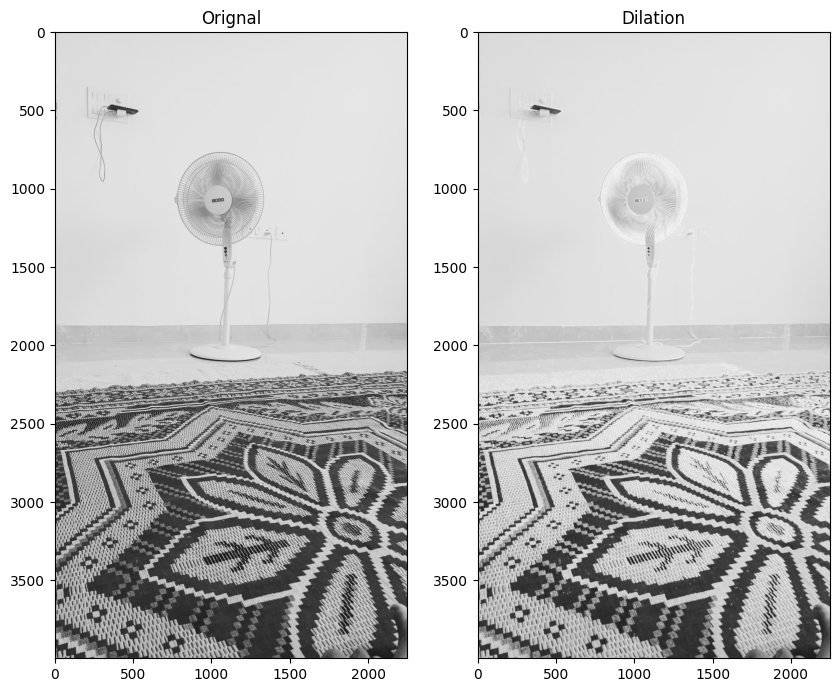

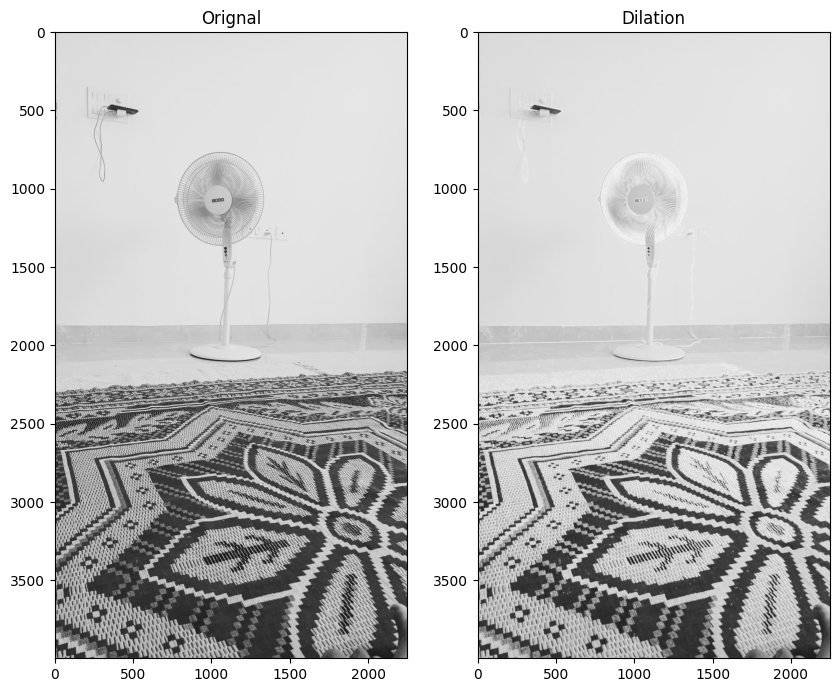

In [110]:
for i in range(1, 6):
    
    gray=get_grayscale(fan)

    image_dilation=dilation(gray, iterations=i)

    plot_image(fan, image_dilation, title_2="Dilation")

Opening

In [111]:
#opening - erosion followed by dilation
# Opening - Good for removing noise
def opening(image, kernel=(5, 5)):
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel=np.ones(kernel, np.uint8))

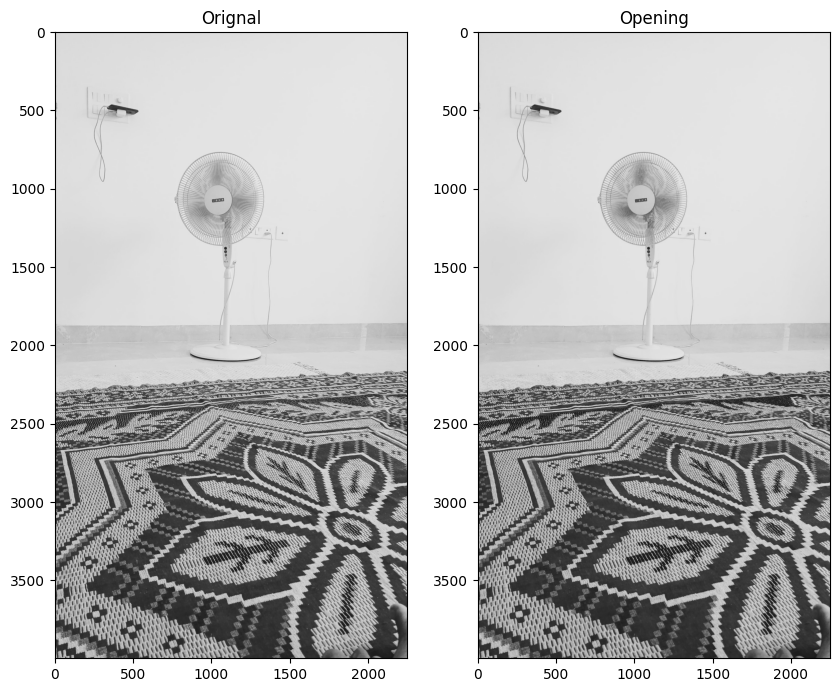

In [112]:
image_opening=opening(fan, (3, 3))

plot_image(fan, image_opening, title_2="Opening")

Closing

In [113]:
# Closing - Good for removing noise
def closing(image, kernel=(5, 5)):
    closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel=np.ones(kernel, np.uint8))
    return closing

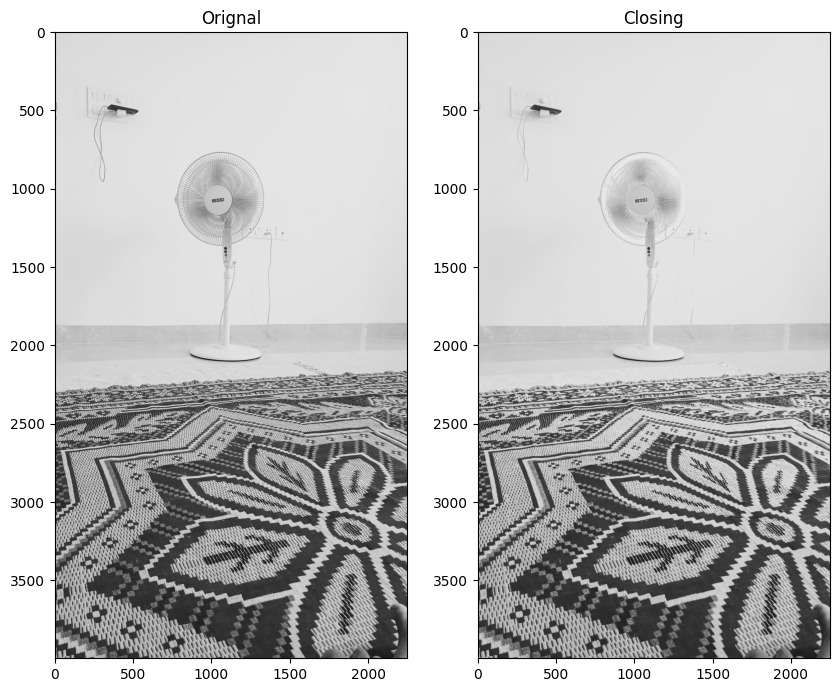

In [114]:
image_closing=closing(fan, (4, 4))

plot_image(fan, image_closing, title_2='Closing')

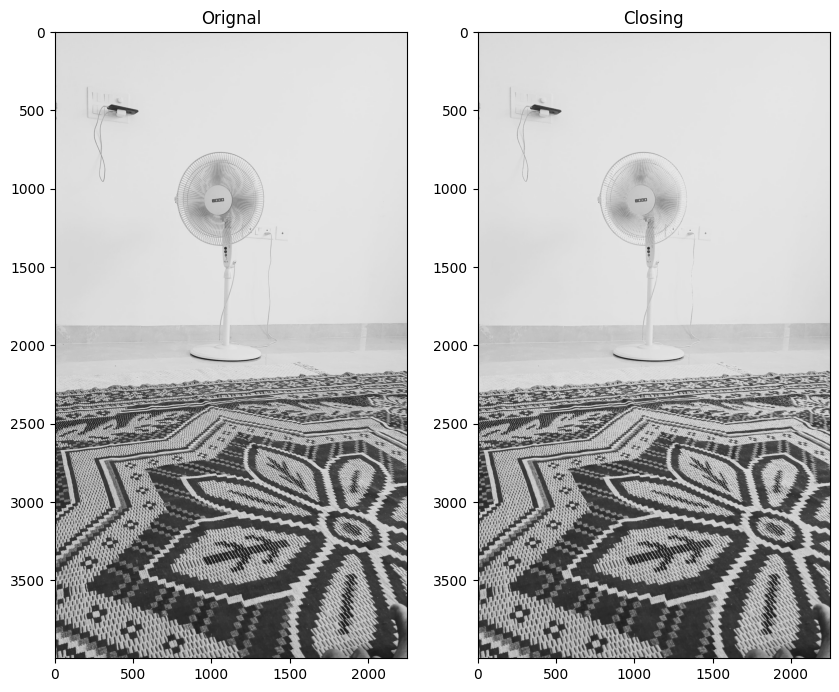

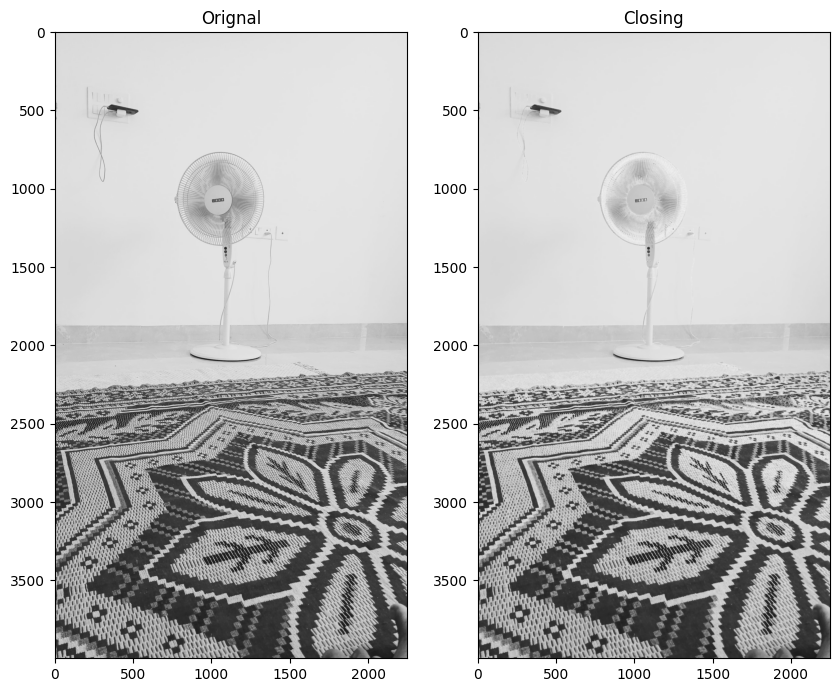

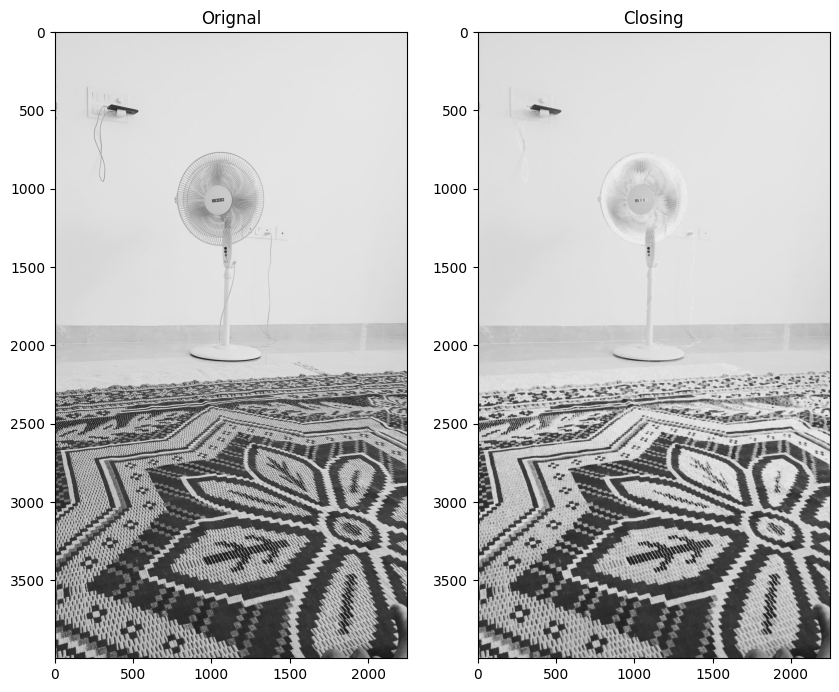

In [115]:
kernel_sizes = [(3, 3), (5, 5), (7, 7)]

for k_s in kernel_sizes:
    image_closing=closing(fan, k_s)
    plot_image(fan, image_closing, title_2='Closing')

Morphological Gradient

In [116]:
def morphological_gradient(image, kernel=(2, 2)):
    gradient = cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel=np.ones((2, 2), np.uint8))
    return gradient

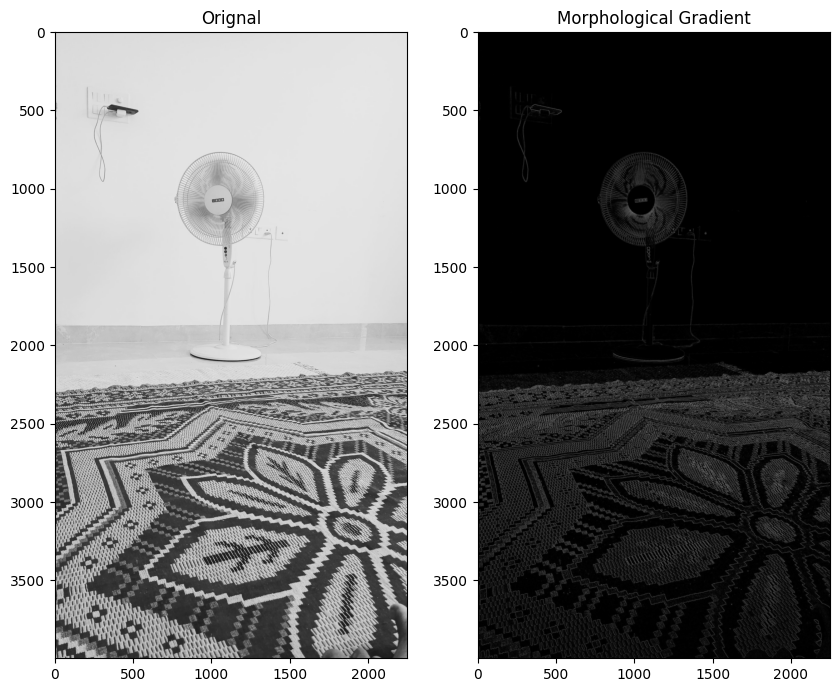

In [117]:
image_gradient=morphological_gradient(fan, (5, 5))
plot_image(fan, image_gradient, title_2="Morphological Gradient")

Top hat

In [118]:
def top_hat(image, kernel=(5, 5)):
    tophat = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel=np.ones(kernel, np.uint8))
    return tophat

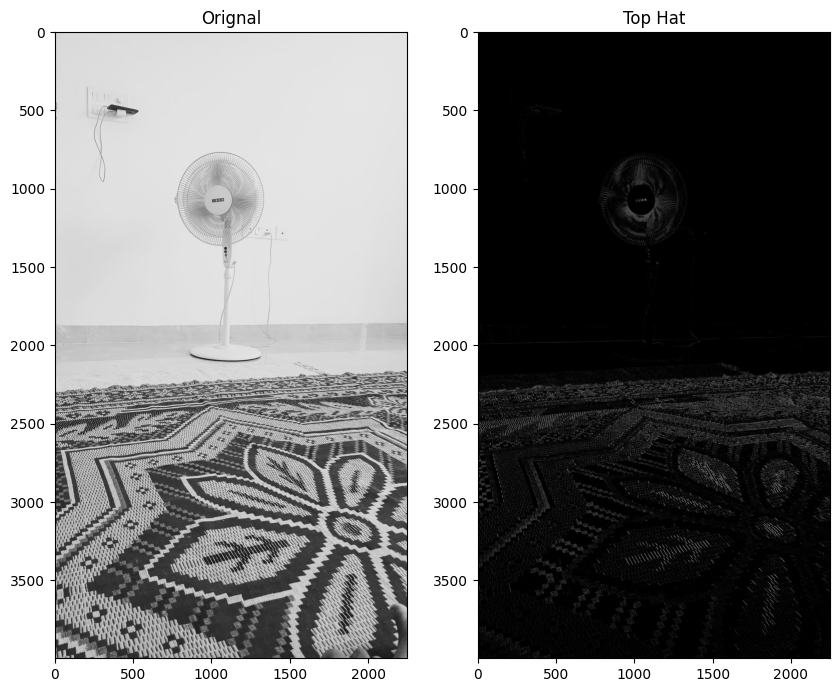

In [119]:
image_top_hat=top_hat(fan)
plot_image(fan, image_top_hat,title_2= "Top Hat")

Black Hat

In [120]:
def black_hat(image, kernel=(4, 4)):
    blackhat = cv2.morphologyEx(image, cv2.MORPH_BLACKHAT, kernel=np.ones(kernel, np.uint8))
    return blackhat

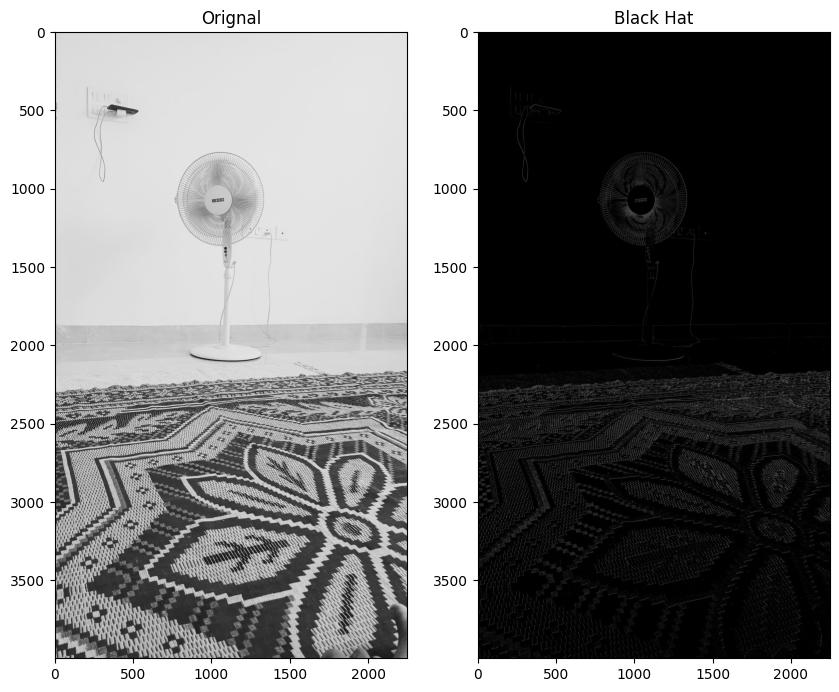

In [121]:
image_black_hat=black_hat(fan)
plot_image(fan, image_black_hat, title_2="Black Hat")

# 8. Edge Detection

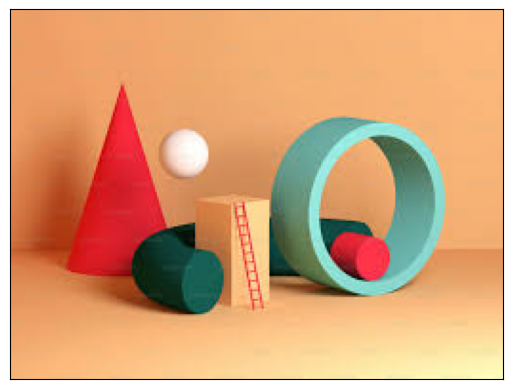

In [122]:
object=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\object.jpeg")
show(object)

In [123]:
def laplacian(image):
    lap=np.uint8(np.absolute(cv2.Laplacian(image,cv2.CV_64F, ksize=1)))
    return  lap

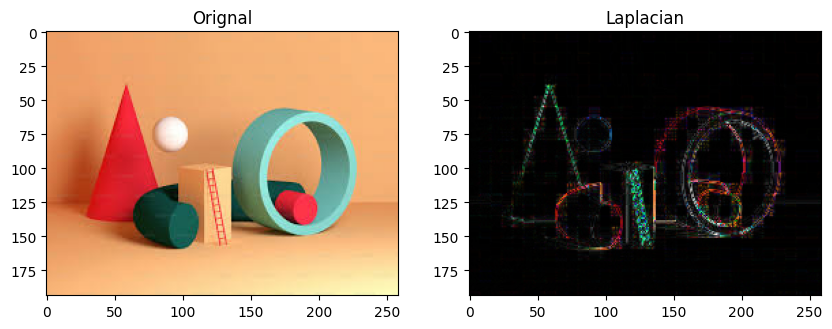

In [124]:
image_lap=laplacian(object)
plot_image(object, image_lap, title_2="Laplacian")

In [125]:
#canny edge detection
def canny(image, th1=100, th2=200, apertureSize=3):
    return cv2.Canny(image, threshold1=th1, threshold2=th2, apertureSize=apertureSize)

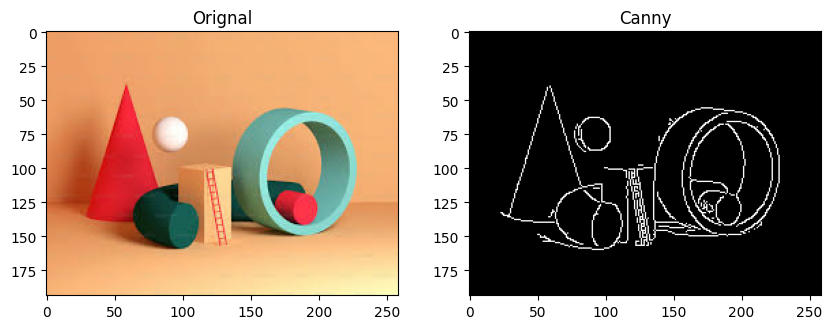

In [126]:
image_canny=canny(object)
plot_image(object, image_canny, title_2="Canny")


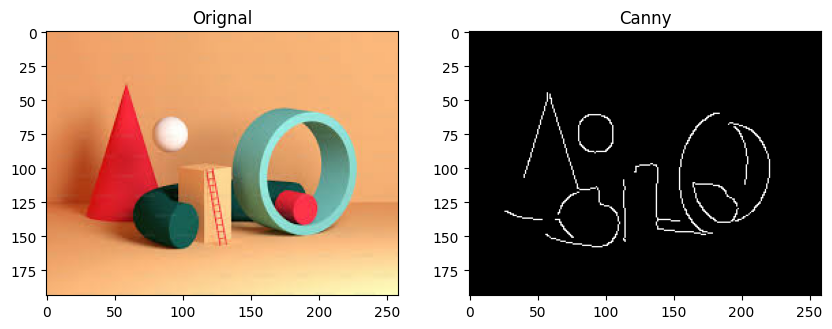

In [127]:
gray=get_grayscale(object)

blurred=gaussian_blur(gray, (5, 5))

dilated=dilation(blurred)

image_canny=canny(dilated)

plot_image(object, image_canny, title_2="Canny")

In [128]:
# Extract Sobel Edges
def sobel(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Sobel image gradient
    vertical = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, 1,0, ksize=1)))
    horizon = np.uint8(np.absolute(cv2.Sobel(image,cv2.CV_64F, 0,1, ksize=1)))
    
    Sobel = cv2.bitwise_or(vertical, horizon)
    
    #sobelx = cv2.Sobel(src=image, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
    #sobely = cv2.Sobel(src=image, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
    #sobelxy = cv2.Sobel(src=image, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
    #sobel_OR = cv2.bitwise_or(sobelx, sobely)
    
    return vertical, horizon, Sobel

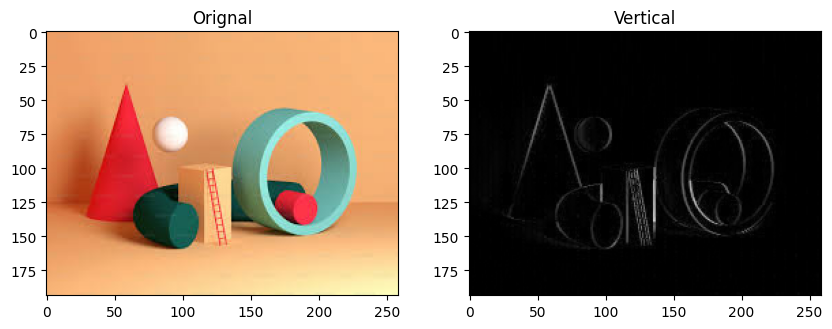

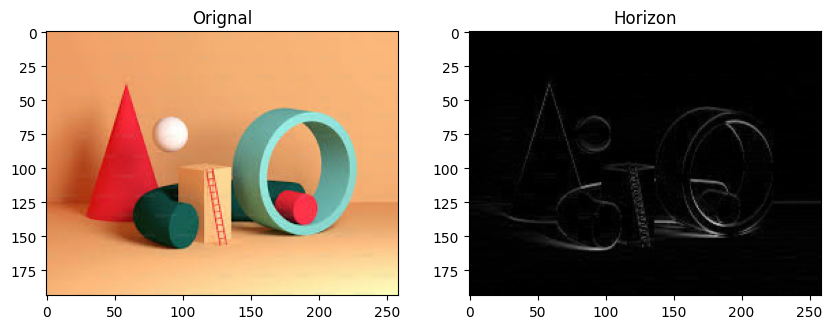

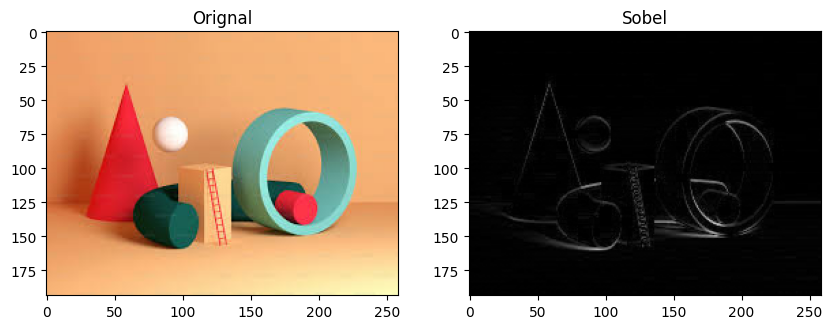

In [129]:
image = get_grayscale(object)

vertical, horizon, Sobel=sobel(image)

#sobelx, sobely, sobelxy, sobel_OR=sobel(image)

#show_result(page_image, sobelx, "Sobel X")

#show_result(page_image, sobely, "Sobel Y")

#show_result(page_image, sobelxy, "Sobel XY")

#show_result(page_image, sobel_OR, "Sobel Bitwise OR")

plot_image(object, vertical, title_2="Vertical")

plot_image(object, horizon, title_2="Horizon")

plot_image(object, horizon, title_2="Sobel")


# 9. Transformation

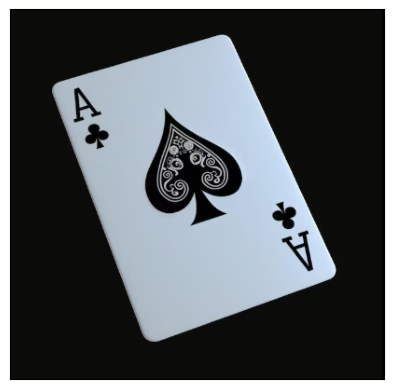

In [130]:
card=cv2.imread(r"C:\Users\SHIVANSHU\Downloads\card.png")
show(card)


In [131]:
def resize(pic):
    img=pic.copy()
    scale_percent = 500/img.shape[0]
    width = int(img.shape[1] * scale_percent )
    height = int(img.shape[0] * scale_percent )
    dim = (width, height)
  
    # resize image
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    
    return resized

In [132]:
card=resize(card)

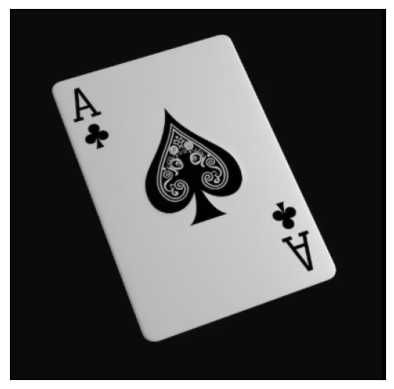

In [133]:
# convert the image to grayscale and threshold it
gray = get_grayscale(card)
show(gray)

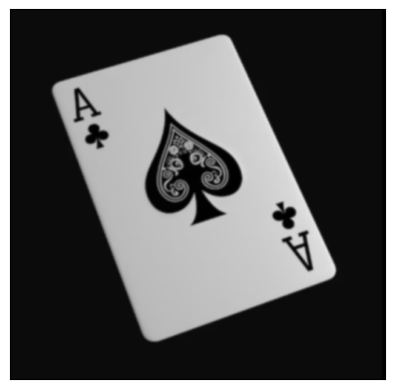

In [134]:
# Get rid of noise with Gaussian Blur filter
blurred = gaussian_blur(gray, (5, 5))
show(blurred)

In [135]:
def detect_white_region(blurred_image, kernel=(3, 3)):

    # Detect white regions
    # next, find regions in the image that are light
    squareKernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel)
    dilated = cv2.dilate(blurred, squareKernel)
    
    edge=canny(dilated)
    
    show(edge)
    
    return edge

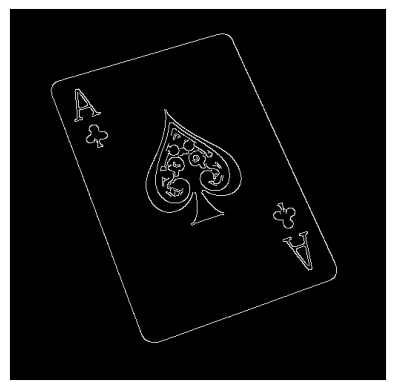

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [136]:
detect_white_region(blurred, (3, 3))

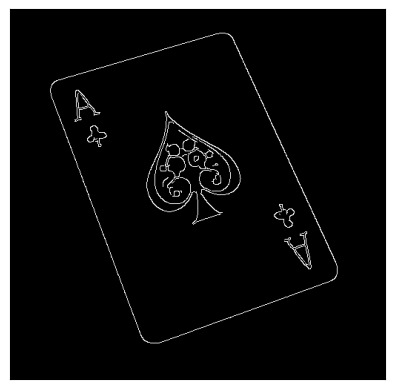

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [137]:
detect_white_region(blurred, (5, 5))

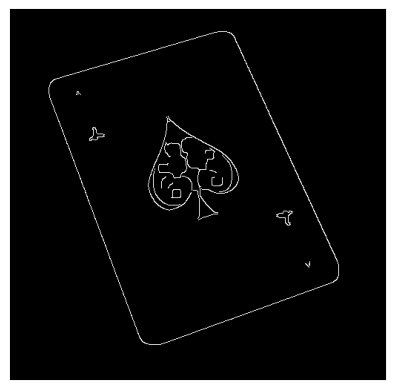

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [138]:
detect_white_region(blurred, (9, 9))

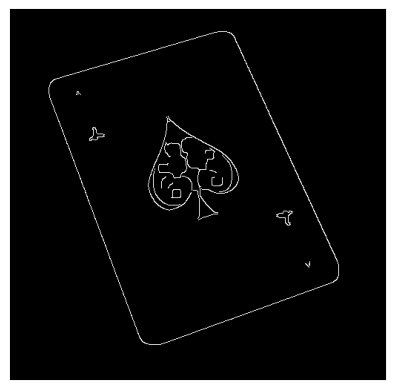

In [139]:
edged=detect_white_region(blurred, (9, 9))

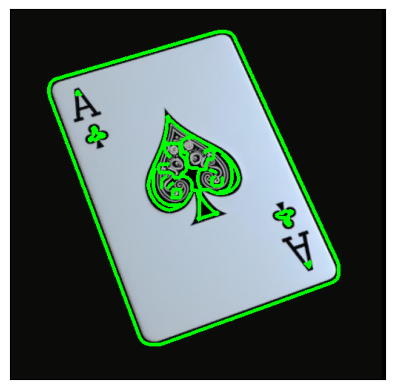

In [140]:
# Detect all contours in Canny-edged image
contours, hierarchy = cv2.findContours(edged, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image_with_contours = cv2.drawContours(card.copy(), contours, -1, (0,255,0), 3)
show(image_with_contours)

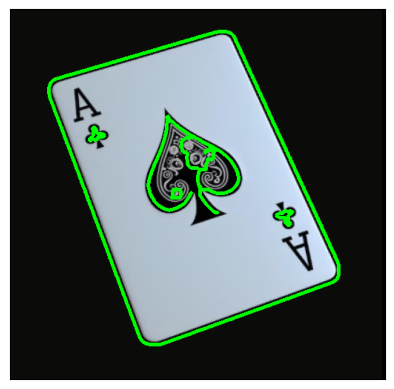

In [141]:
# Get 10 largest contours
largest_contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]
image_with_largest_contours = cv2.drawContours(card.copy(), largest_contours, -1, (0,255,0), 3)
show(image_with_largest_contours)

In [142]:
#0.02*per
#0.03*peri
#0.031*peri
#0.032*peri
def approximate_contour(contour):
    perimeter = cv2.arcLength(contour, True)
    approximatedShape = cv2.approxPolyDP(contour, 0.032 * perimeter, True)
    return approximatedShape

In [143]:
def contour_4(contours):
    for contour in contours:
        polygon_shape=approximate_contour(contour)
        
        #len(contour) == 4   #Rectangle
        if len(polygon_shape)==4:
            return polygon_shape

In [144]:
rec_contour=contour_4(largest_contours)
print(rec_contour)

[[[296  31]]

 [[ 52 105]]

 [[183 451]]

 [[443 359]]]


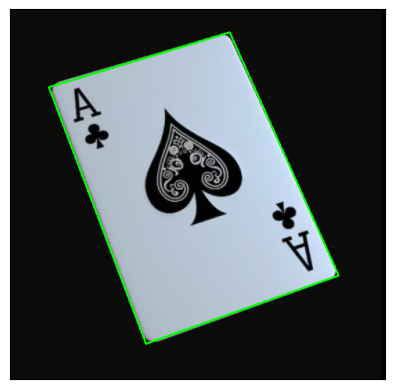

In [145]:
image_with_rec_contour = cv2.drawContours(card.copy(), [rec_contour], -1, (0, 255, 0), 2)
show(image_with_rec_contour)

In [146]:
def con_rect(rec_contour, ratio):
    # now that we have our screen contour, we need to determine
    # the top-left, top-right, bottom-right, and bottom-left
    # points so that we can later warp the image -- we'll start
    # by reshaping our contour to be our finals and initializing
    # our output rectangle in top-left, top-right, bottom-right,
    # and bottom-left order
    pts = rec_contour.reshape(4, 2)
    rect = np.zeros((4, 2), dtype = "float32")

    # the top-left point has the smallest sum whereas the
    # bottom-right has the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    # compute the difference between the points -- the top-right
    # will have the minumum difference and the bottom-left will
    # have the maximum difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    # multiply the rectangle by the original ratio
    rect /= ratio
    
    return rect

In [147]:
rect=con_rect(rec_contour, 500/card.shape[0])
print(rect)

[[ 51.896   104.79   ]
 [295.408    30.938  ]
 [442.11398 358.28198]
 [182.634   450.098  ]]


In [148]:
def warp_prespective(original_image, rect):
    # now that we have our rectangle of points, let's compute
    # the width of our new image
    (tl, tr, br, bl) = rect
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    # ...and now for the height of our new image
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    # take the maximum of the width and height values to reach

    # our final dimensions
    maxWidth = max(int(widthA), int(widthB))
    maxHeight = max(int(heightA), int(heightB))
    # construct our destination points which will be used to
    # map the screen to a top-down, "birds eye" view
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")
    # calculate the perspective transform matrix and warp
    # the perspective to grab the screen
    M = cv2.getPerspectiveTransform(rect, dst)
    warp = cv2.warpPerspective(original_image.copy(), M, (maxWidth, maxHeight))
    
    return warp

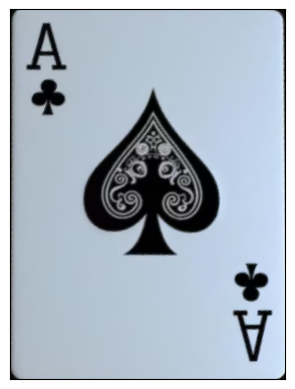

In [149]:
warp=warp_prespective(card, rect)
show(warp)